# Predicción de la diabetes con PySpark y MLlib

### Fases habituales del modelo de Machine Learning

La mayoría de proyectos de Data Science y generación de modelos de inteligencia artificial contienen unas fases comunes:
1. Importanción y limpieza de datos: se cargan los datos, normalmente en formato de DataFrame y se pre-procesan (eliminación de valores nulos, normalización, ingenieria de variables, etc)
2. División de datos de entrenamiento y de test
3. Entrenamiento y optimiazación del modelo 
4. Evaluación y despliegue del modelo


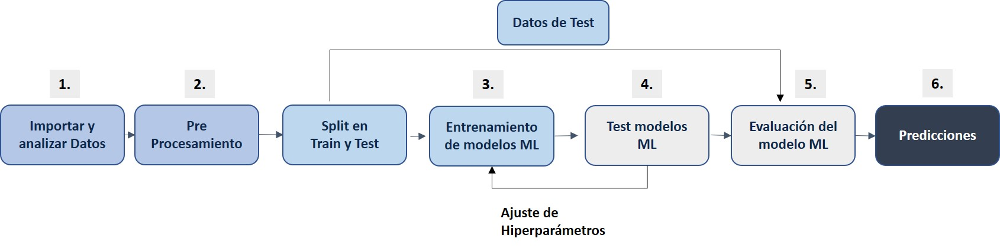

#### Analisis del contexto del problema

#### Tipo de Problema
**Objetivo:** Predicción del desarrollo de diabetes en base a marcadores bio-quimicos

**Tipo de modelo de ML:** supervisado y clasificación binaria

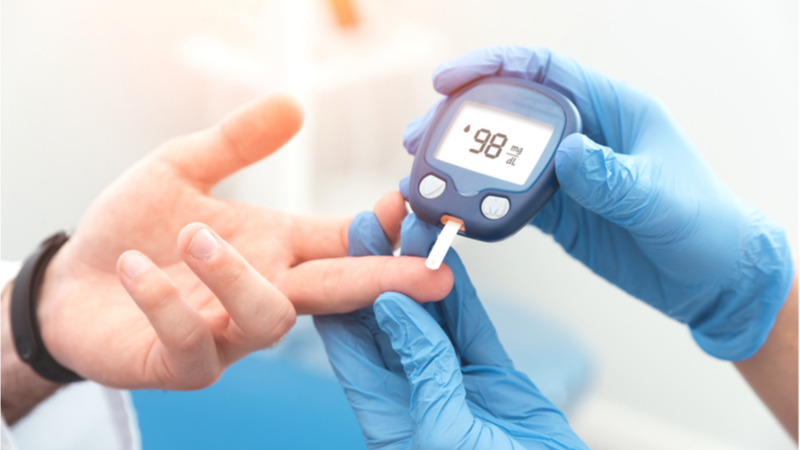

*Fuente: https://www.lifespan.io/news/towards-a-possible-solution-to-diabetes/*

# Tarea 1. Importación y análisis exploratorio de los datos

### Fase 1. Importacion de datos

In [1]:
import findspark
findspark.init()

In [3]:
import pandas as pd
import pyspark
from pyspark.ml import Pipeline
from pyspark.ml.feature import OneHotEncoder, StringIndexer, VectorAssembler
from pyspark.ml.feature import MinMaxScaler
from pyspark.sql import SparkSession
from pyspark.conf import SparkConf
from pyspark.sql.types import * 
import pyspark.sql.functions as F
from pyspark.sql.functions import col, asc,desc
import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns
from pyspark.sql import SQLContext
from pyspark.mllib.stat import Statistics
import pandas as pd
from pyspark.sql.functions import udf
from pyspark.ml.feature import StringIndexer, VectorAssembler,StandardScaler
from pyspark.ml import Pipeline
from sklearn.metrics import confusion_matrix

#### Iniciar sesion de Spark

In [4]:
from pyspark.sql import SparkSession
spark = SparkSession \
    .builder \
    .appName('Diabetes') \
    .getOrCreate()

In [5]:
df=spark.read \
 .option("header","True")\
 .option("inferSchema","True")\
 .option("sep",",")\
 .csv("diabetes.csv")

print("There are",df.count(),"rows",len(df.columns),\
      "columns" ,"in the data.") 

There are 768 rows 9 columns in the data.


#### Ejemplo de  un conjunto de datos

In [6]:
df.show(5)

+-----------+-------+-------------+-------------+-------+----+------------------------+---+-------+
|Pregnancies|Glucose|BloodPressure|SkinThickness|Insulin| BMI|DiabetesPedigreeFunction|Age|Outcome|
+-----------+-------+-------------+-------------+-------+----+------------------------+---+-------+
|          6|    148|           72|           35|      0|33.6|                   0.627| 50|      1|
|          1|     85|           66|           29|      0|26.6|                   0.351| 31|      0|
|          8|    183|           64|            0|      0|23.3|                   0.672| 32|      1|
|          1|     89|           66|           23|     94|28.1|                   0.167| 21|      0|
|          0|    137|           40|           35|    168|43.1|                   2.288| 33|      1|
+-----------+-------+-------------+-------------+-------+----+------------------------+---+-------+
only showing top 5 rows



#### Tipos de datos

In [7]:
df.printSchema()

root
 |-- Pregnancies: integer (nullable = true)
 |-- Glucose: integer (nullable = true)
 |-- BloodPressure: integer (nullable = true)
 |-- SkinThickness: integer (nullable = true)
 |-- Insulin: integer (nullable = true)
 |-- BMI: double (nullable = true)
 |-- DiabetesPedigreeFunction: double (nullable = true)
 |-- Age: integer (nullable = true)
 |-- Outcome: integer (nullable = true)



In [13]:
df.count()

768

In [14]:
# Basics stats from our columns
dataframe = df.toPandas()
df.describe().toPandas()

,summary,Pregnancies,Glucose,BloodPressure,SkinThickness,Insulin,BMI,DiabetesPedigreeFunction,Age,Outcome
0,count,768,768,768,768,768,768,768,768,768
1,mean,3.8450520833333335,120.89453125,69.10546875,20.536458333333332,79.79947916666667,31.992578124999977,0.4718763020833327,33.240885416666664,0.3489583333333333
2,stddev,3.36957806269887,31.97261819513622,19.355807170644777,15.952217567727642,115.24400235133803,7.884160320375441,0.331328595012775,11.760231540678689,0.476951377242799
3,min,0,0,0,0,0,0.0,0.078,21,0
4,max,17,199,122,99,846,67.1,2.42,81,1


### Analisis Exploratorio (EDA)

In [49]:
from pandas_profiling import ProfileReport

#EDA using Pandas Profiling
file = ProfileReport(dataframe)
file

#### Analisis de valores faltantes

In [16]:
from pyspark.sql.functions import isnan, when, count, col
df.select([count(when(isnan(c), c)).alias(c) for c in df.columns]).toPandas().head()

# Drop missing values
dataset = dataset.replace('null', None)\
        .dropna(how='any')

,Pregnancies,Glucose,BloodPressure,SkinThickness,Insulin,BMI,DiabetesPedigreeFunction,Age,Outcome
0,0,0,0,0,0,0,0,0,0


#### Distribución de los datos

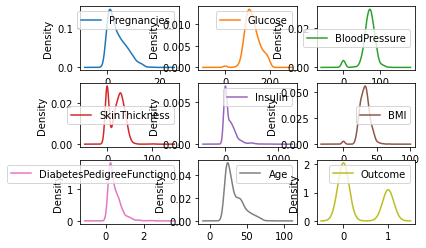

<Figure size 2160x2160 with 0 Axes>

In [29]:

# Density plots for all attributes
dataframe.plot(kind='density', subplots=True, layout=(3,3), sharex=False)

plt.show()

#### Distribución de los datos en funcion del target

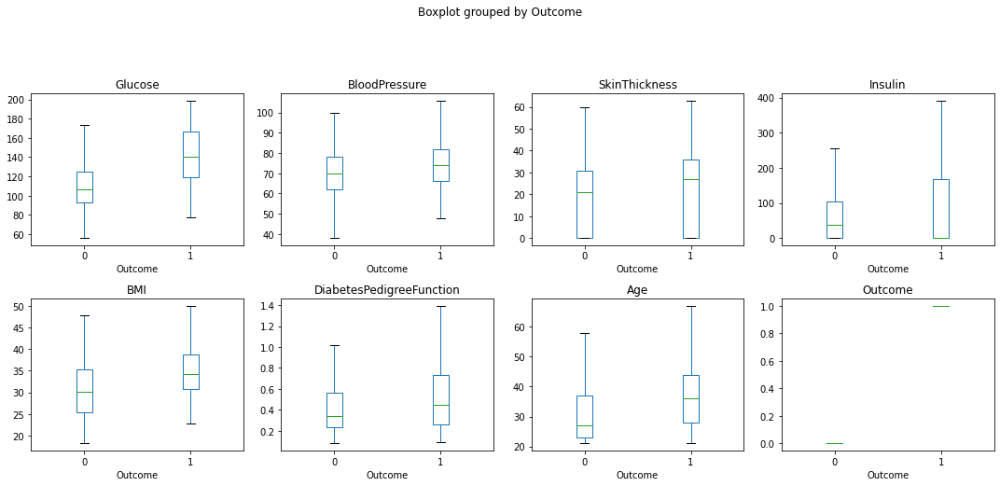

In [31]:
import matplotlib.pyplot as plt
plot_columns = dataframe.columns
plot_columns

# Displays ranges, percentiles, and averages of users that churned vs those that did not churn per page type
fig = plt.figure(figsize=(15, 20))

for i in range(1,len(plot_columns)):
    axis = fig.add_subplot(6,4,i)
    dataframe.boxplot(plot_columns[i], ax = axis, grid = False,  by='Outcome', showfliers=False)
    
fig.tight_layout(rect=[0, 0.03, 1, 0.95])

#### Analisis de correlacion

In [33]:
# Compute the correlation matrix 
correlations = dataframe.corr(method = 'pearson') # Correlations between all pairs of attributes
# Print the datatype 
type(correlations)
# Show the correlation matrix 
correlations

,Pregnancies,Glucose,BloodPressure,SkinThickness,Insulin,BMI,DiabetesPedigreeFunction,Age,Outcome
Pregnancies,1.000000,0.129459,0.141282,-0.081672,-0.073535,0.017683,-0.033523,0.544341,0.221898
Glucose,0.129459,1.000000,0.152590,0.057328,0.331357,0.221071,0.137337,0.263514,0.466581
BloodPressure,0.141282,0.152590,1.000000,0.207371,0.088933,0.281805,0.041265,0.239528,0.065068
SkinThickness,-0.081672,0.057328,0.207371,1.000000,0.436783,0.392573,0.183928,-0.113970,0.074752
Insulin,-0.073535,0.331357,0.088933,0.436783,1.000000,0.197859,0.185071,-0.042163,0.130548
BMI,0.017683,0.221071,0.281805,0.392573,0.197859,1.000000,0.140647,0.036242,0.292695
DiabetesPedigreeFunction,-0.033523,0.137337,0.041265,0.183928,0.185071,0.140647,1.000000,0.033561,0.173844
Age,0.544341,0.263514,0.239528,-0.113970,-0.042163,0.036242,0.033561,1.000000,0.238356
Outcome,0.221898,0.466581,0.065068,0.074752,0.130548,0.292695,0.173844,0.238356,1.000000


<AxesSubplot:>

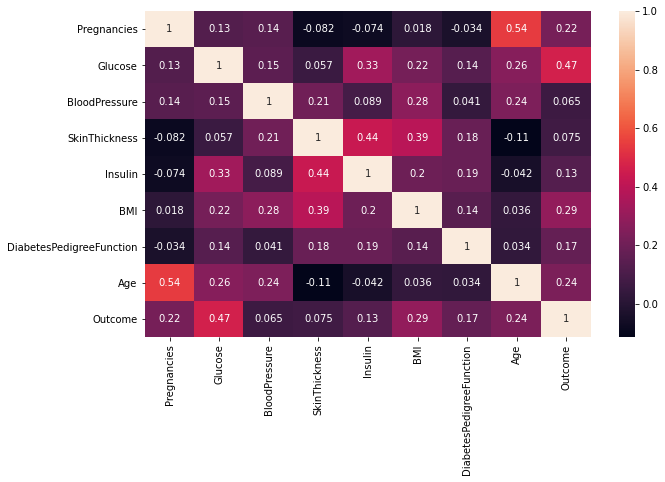

In [43]:
plt.figure(figsize=(10,6))
sns.heatmap(correlations, annot = True)

#### Multicorrelacion

El coeficiente de correlación (r) es 0,544. Por regla general, en el caso de una r superior a 0,70, se espera una multicolinealidad. Por tanto, no se observa ningún caso significativo de multicolinealidad.

In [45]:
from scipy.stats import pearsonr
corr, _ = pearsonr(dataframe['Age'], dataframe['Pregnancies'])
print('Pearsons correlation: %.3f' % corr)


Pearsons correlation: 0.544


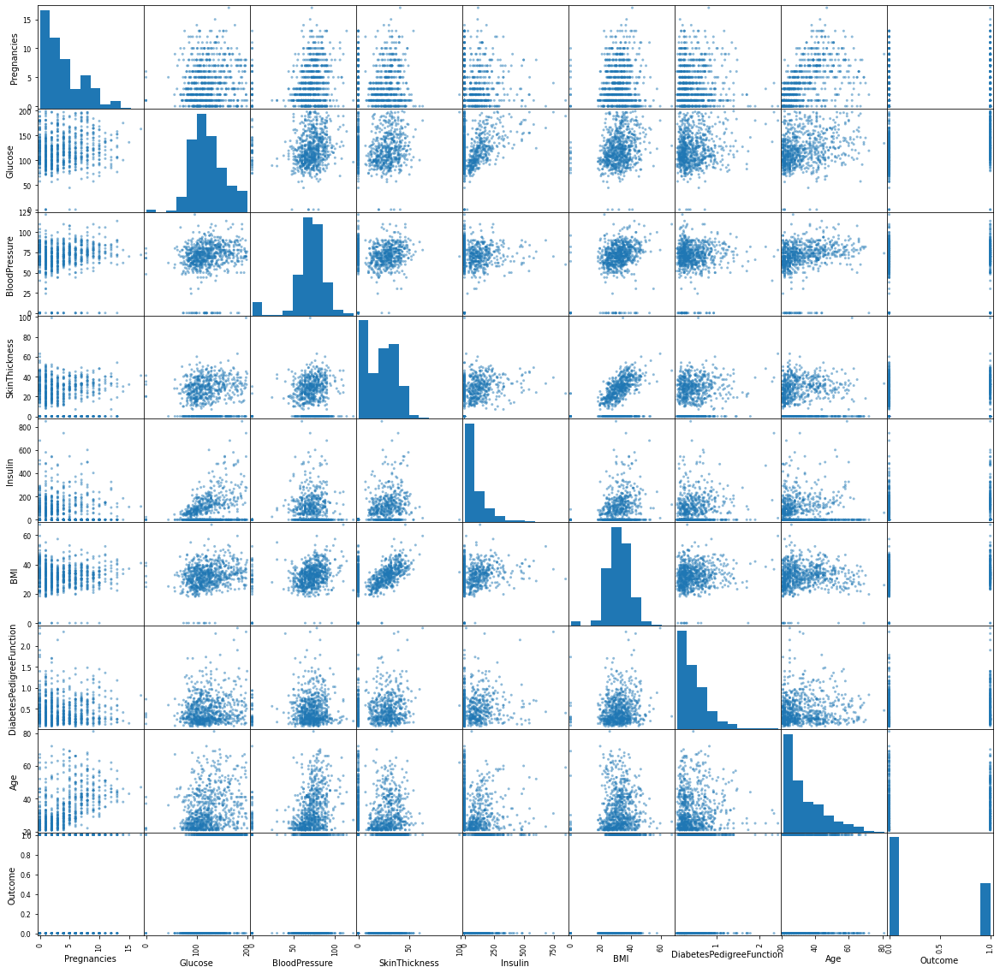

<Figure size 720x432 with 0 Axes>

In [47]:

# Import required package 
from pandas.plotting import scatter_matrix
plt.rcParams['figure.figsize'] = [20, 20]

# Plotting Scatterplot Matrix
scatter_matrix(dataframe)
plt.figure(figsize=(10,6))
plt.show()

# Tarea 2. Pre-procesamiento de datos con PySpark

### Fase 2. Pre-procesamiento de datos para MLlib

#### Ingenieria de variables

In [60]:
from pyspark.sql.functions import udf
def udf_multiple(age):
      if (age <= 25):
        return 'Menor 25'
      elif (age >= 25 and age <= 35):
        return 'Entre 25 y 35'
      elif (age > 35 and age < 50):
        return 'Entre 36 y 49'
      elif (age >= 50):
        return 'Mas de 50'
      else: return 'N/A'

edad = udf(udf_multiple)
df=df.withColumn("Rango_edad", edad('Age'))

In [61]:
df.head()

Row(Pregnancies=6, Glucose=148, BloodPressure=72, SkinThickness=35, Insulin=0, BMI=33.6, DiabetesPedigreeFunction=0.627, Age=50, Outcome=1, Age_udf='Over 50', Rango_edad='Mas de 50')

In [62]:
df.columns

['Pregnancies',
 'Glucose',
 'BloodPressure',
 'SkinThickness',
 'Insulin',
 'BMI',
 'DiabetesPedigreeFunction',
 'Age',
 'Outcome',
 'Age_udf',
 'Rango_edad']

#### De variables categoricas a numericas

In [70]:
from pyspark.ml.feature import StringIndexer

# list of numerical columns
numerical_cols =['Pregnancies',
                 'Glucose',
                 'BloodPressure',
                 'SkinThickness',
                 'Insulin',
                 'BMI',
                 'DiabetesPedigreeFunction']

# convert sting column to index column
indexer = StringIndexer(inputCol='Rango_edad', outputCol='Rango_edadIndex', handleInvalid='skip')

# one hot encode categorical columns to numerical vector columns
encoder = OneHotEncoder(inputCol='Rango_edadIndex', outputCol='Rango_edadIndex_df', handleInvalid='keep')

#### Normalizacion de variables numericas

In [71]:
# transform numerical columns to a single vector column
num_assembler = VectorAssembler(inputCols=numerical_cols, outputCol='num_features')

# apply scaler (MinMax scaler preserves original data distribution)
scaler = StandardScaler(inputCol='num_features', outputCol='scaled_features')

#### Vector asembler

In [72]:
# transform all create vector columns into one vector column
assembler = VectorAssembler(inputCols=['Rango_edadIndex_df', 'scaled_features'], \
                            outputCol='features')

#### Creacion del Pipeline

In [73]:
# create pipeline with above steps
data_pipeline = Pipeline(stages=[indexer,encoder, num_assembler, scaler, assembler])

# Tarea 3: Entrenamiento de modelos simples con MLlib

### Fase 3. Entrenamiento del modelo


#### Train Test Split

In [74]:
# fit pipeline and transform dataframe
df = data_pipeline.fit(df).transform(df)

In [75]:
# split data into train, validation and test sets
train, validation_test = df.randomSplit([0.7, 0.3], seed = 4)
validation, test = validation_test.randomSplit([0.5, 0.5], seed = 4)


print("Training Dataset Count: " + str(train.count()))
print("Test Dataset Count: " + str(test.count()))


Training Dataset Count: 537
Test Dataset Count: 119


#### Modelo de clasificación simple (baseline accuracy)

In [82]:
from pyspark.ml.classification import *
from time import *

# instantiate and train naive bayes
start = time()
nb = NaiveBayes(featuresCol='features', labelCol='Outcome')

nb_model = nb.fit(train)
end = time()
print('Total training time for naive bayes: {} seconds'.format(end-start))
predictions = nb_model.transform(test)
predictions.select( 'features', 'Outcome', 'rawPrediction', 'prediction', 'probability').toPandas().head(5)

Total training time for naive bayes: 1.8058555126190186 seconds


,features,Outcome,rawPrediction,prediction,probability
0,"(0.0, 0.0, 0.0, 1.0, 0.0, 1.7827754878288644, ...",0,"[-22.54264034708399, -22.766751954867164]",0.0,"[0.5557945689711632, 0.4442054310288367]"
1,"(1.0, 0.0, 0.0, 0.0, 0.0, 3.1589530573809705, ...",0,"[-22.208605469083, -24.256211207543767]",0.0,"[0.8857054682685306, 0.11429453173146935]"
2,"[1.0, 0.0, 0.0, 0.0, 0.0, 3.1902298203253365, ...",0,"[-31.90503548367667, -34.188282240012924]",0.0,"[0.9074800055724983, 0.09251999442750175]"
3,"(0.0, 1.0, 0.0, 0.0, 0.0, 3.2527833462140685, ...",0,"[-23.091919705946697, -23.905774454053628]",0.0,"[0.6929303188999779, 0.3070696811000221]"
4,"(1.0, 0.0, 0.0, 0.0, 0.0, 3.3466136350471665, ...",0,"[-23.540014644692935, -25.631510846843405]",0.0,"[0.8900739030334227, 0.1099260969665773]"


In [83]:
# Evaluate our model
from pyspark.ml.evaluation import *

evaluator = MulticlassClassificationEvaluator(
    labelCol='Outcome', 
    predictionCol='prediction', 
    metricName='accuracy')

# Accuracy
accuracy = evaluator.evaluate(predictions)
print('Test Accuracy = ', accuracy)

Test Accuracy =  0.6050420168067226


# Tarea 4: Entrenamiento avanzado de modelos y optimización con MLlib

#### Multiples modelos

In [84]:
# instantiate and train naive bayes
start = time()

nb = NaiveBayes(featuresCol='features', labelCol='Outcome')
nb_model = nb.fit(train)

lr = LogisticRegression(featuresCol='features', labelCol='Outcome')
lr_model = lr.fit(train)

svc = LinearSVC(featuresCol='features', labelCol='Outcome')
svc_model = svc.fit(train)

rf = RandomForestClassifier(featuresCol='features', labelCol='Outcome')
rf_model = rf.fit(train)

dt = DecisionTreeClassifier(featuresCol='features', labelCol='Outcome')
dt_model = dt.fit(train)

gbt = GBTClassifier(featuresCol='features', labelCol='Outcome')
gbt_model = gbt.fit(train)

end = time()
print('Total training time for naive bayes: {} seconds'.format(end-start))
predictions = nb_model.transform(test)

Total training time for naive bayes: 31.49936294555664 seconds


In [85]:
# make baseline model predictions
# create lists with the models and their respective names
models = [nb_model, 
          lr_model, 
          svc_model, 
          rf_model, 
          dt_model,
          gbt_model]

model_names = ['naive bayes', 
               'logistic regression', 
               'linear svc', 
               'random forest', 
               'decision tree',
                'Gradient Boosting']

# for all models, make prediction, calculate f1 and area under the PR scores and display results
for i in range(len(models)):
    model = models[i]
    model_name = model_names[i]
    
    # predict on validation set
    validation_prediction = model.transform(validation)
 
    # use MulticlassClassificationEvaluator to get f1 scores
    evaluator1 = MulticlassClassificationEvaluator(labelCol='Outcome')
 
    # use BinaryClassificationEvaluator to get area under PR 
    evaluator2 = BinaryClassificationEvaluator(
                 rawPredictionCol='prediction', labelCol='Outcome')
    # make evaluation and print f1 and area under PR score per model
    print('')
    print('F1 score for {} on validation set:{}'.format(\
          (model_name), \
          (evaluator1.evaluate(validation_prediction, {evaluator1.metricName:'f1'}))))
 
    print('Area under PR for {} on validation set: {}'.format((model_name), \
          (evaluator2.evaluate(validation_prediction,{evaluator2.metricName:'areaUnderPR'}))))


F1 score for naive bayes on validation set:0.6727944671546726
Area under PR for naive bayes on validation set: 0.5056089743589743

F1 score for logistic regression on validation set:0.7475843032336045
Area under PR for logistic regression on validation set: 0.6251144688644689

F1 score for linear svc on validation set:0.7367663981588032
Area under PR for linear svc on validation set: 0.6125525708859042

F1 score for random forest on validation set:0.7068508535489668
Area under PR for random forest on validation set: 0.5676422936038321

F1 score for decision tree on validation set:0.6922715572715572
Area under PR for decision tree on validation set: 0.5170558608058607

F1 score for Gradient Boosting on validation set:0.7124568177199756
Area under PR for Gradient Boosting on validation set: 0.5408963221463222


#### Ajuste de hiperparametros de Regresion Logistica

In [91]:
from pyspark.ml.tuning import CrossValidator, ParamGridBuilder
# tune hyperparameters with ParamGridBuilder and CrossValidator
# build paramGrid with hyperparameters to tune

start = time()

# Create ParamGrid for Cross Validation
paramGrid = (ParamGridBuilder()
             .addGrid(lr.regParam, [0.01, 0.5, 2.0])# regularization parameter
             .addGrid(lr.elasticNetParam, [0.0, 0.5, 1.0])# Elastic Net Parameter (Ridge = 0)
             .addGrid(lr.maxIter, [1, 5, 10])#Number of iterations
             .build())

cv = CrossValidator(estimator=lr, estimatorParamMaps=paramGrid, 
                    evaluator=evaluator, numFolds=5)

cvModel = cv.fit(train)

end = time()
print('Total training time for hyperparameter tuning on random forest model: {} seconds'.format(end-start))

Total training time for hyperparameter tuning on random forest model: 60.924925088882446 seconds


#### Ajuste de hiperparametros de Gradiente Boosting Tree

In [87]:
# fit cv model and train it
start = time()

paramGrid_gbt = ParamGridBuilder() \
    .addGrid(gbt.maxDepth,[5, 10]) \
    .addGrid(gbt.maxIter,[5, 10]) \
    .build()

crossval = CrossValidator(estimator=gbt,
                          estimatorParamMaps=paramGrid_gbt,
                          evaluator=MulticlassClassificationEvaluator(labelCol='Outcome',metricName='f1'),
                          numFolds=3)

# fit cv model and train it
start = time()
cvModel_gbt  = crossval.fit(train)
end = time()
print('Total training time for hyperparameter tuning on random forest model: {} seconds'.format(end-start))

Total training time for hyperparameter tuning on random forest model: 52.962124824523926 seconds


# Tarea 5: Evaluación de modelos

### Fase 4. Evaluación del modelo

#### Modelo de Regresion logistica optimizado

In [93]:
# use MulticlassClassificationEvaluator to get f1 scores
evaluator = MulticlassClassificationEvaluator(labelCol='Outcome')


# test baseline random forest model on test set
# predict on test set
test_prediction_rf_baseline = lr_model.transform(test)

# make evaluation and print f1-score
print('')
print('F-1 Score for baseline random forest model on test set: {}'.format(evaluator.evaluate(
            test_prediction_rf_baseline, {evaluator.metricName:'f1'})))



# predict on test set
test_prediction_rf = cvModel.transform(test)

# make evaluation and print f1-score
print('')
print('F-1 Score for tuned random forest model on test set: {}'.format(evaluator.evaluate(
    test_prediction_rf, {evaluator.metricName:'f1'})))




# predict on validation set
validation_prediction_rf = cvModel.transform(validation)

# make evaluation and print f1-score
print('')
print('F-1 Score for tuned random forest model on validation set: {}'.format(evaluator.evaluate(
 validation_prediction_rf, {evaluator.metricName:'f1'})))



F-1 Score for baseline random forest model on test set: 0.6966478899252009

F-1 Score for tuned random forest model on test set: 0.7139822962151894

F-1 Score for tuned random forest model on validation set: 0.7288868442138714


#### Modelo de Gradient Boosting Trees optimizado

In [90]:
results_final = cvModel_gbt.transform(test)

evaluator = MulticlassClassificationEvaluator(predictionCol="prediction",labelCol='Outcome')
print('Test Set Prediction Metrics:')
print('F-1 Score:{}'.format(evaluator.evaluate(results_final, {evaluator.metricName: "f1"})))
print('Accuracy: {}'.format(evaluator.evaluate(results_final, {evaluator.metricName: "accuracy"})))
print('')

# predict on validation set
results_final = cvModel_gbt.transform(validation)
evaluator = MulticlassClassificationEvaluator(predictionCol="prediction",labelCol='Outcome')
print('Validation Set Prediction Metrics:')
print('F-1 Score:{}'.format(evaluator.evaluate(results_final, {evaluator.metricName: "f1"})))
print('Accuracy: {}'.format(evaluator.evaluate(results_final, {evaluator.metricName: "accuracy"})))

Test Set Prediction Metrics:
F-1 Score:0.7288710266715381
Accuracy: 0.7310924369747899

Validation Set Prediction Metrics:
F-1 Score:0.7204650047938639
Accuracy: 0.7232142857142857
